# Génération d'archétypes visuels pour les caractères arméniens

## Objectifs
1. **Superposition intelligente** : aligner et superposer les caractères d'une même classe
2. **Archétypes** : générer des prototypes représentatifs de chaque classe
3. **Intervalles de confiance** : visualiser la variabilité spatiale
4. **Sous-types** : identifier s'il existe plusieurs archétypes au sein d'une classe
5. **Esthétique** : présentation claire et élégante des résultats

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import cv2
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

from scipy.ndimage import shift, rotate
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("husl")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['figure.facecolor'] = 'white'

## 1. Chargement des données

In [12]:
def load_images_from_folder(folder_path, target_size=(64, 64)):
    """Charge les images par classe"""
    images = []
    labels = []
    class_names = []
    
    folder = Path(folder_path)
    
    for class_dir in sorted(folder.iterdir()):
        if class_dir.is_dir():
            class_name = class_dir.name
            class_names.append(class_name)
            
            for img_path in sorted(class_dir.glob('*')):
                if img_path.suffix.lower() in ['.png', '.jpg', '.jpeg', '.bmp']:
                    try:
                        img = Image.open(img_path).convert('RGB')
                        img = img.resize(target_size, Image.Resampling.LANCZOS)
                        img_array = np.array(img)
                        images.append(img_array)
                        labels.append(class_name)
                    except Exception as e:
                        print(f"Erreur: {img_path}: {e}")
    
    return np.array(images), np.array(labels), class_names


hye_path = "data/HYE_data_classif_cours_light"
images, labels, class_names = load_images_from_folder(hye_path, target_size=(128, 128))

print(f"Chargé {len(images)} images")
print(f"Classes: {class_names}")
print(f"Résolution: {images.shape[1]}×{images.shape[2]} pixels")

Chargé 364 images
Classes: ['class_1', 'class_2', 'class_3', 'class_4', 'class_5', 'class_6', 'class_7']
Résolution: 128×128 pixels


## 2. Fonctions d'alignement et de normalisation

In [13]:
def align_image_to_centroid(img):
    """
    Aligne une image sur son centre de masse
    """
    if len(img.shape) == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    else:
        gray = img.copy()
    
    # Binarisation
    _, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
    
    # Moments pour trouver le centre de masse
    M = cv2.moments(binary)
    if M['m00'] == 0:
        return img
    
    cx = int(M['m10'] / M['m00'])
    cy = int(M['m01'] / M['m00'])
    
    # Centre de l'image
    img_center_x = img.shape[1] // 2
    img_center_y = img.shape[0] // 2
    
    # Translation
    shift_x = img_center_x - cx
    shift_y = img_center_y - cy
    
    M_translate = np.float32([[1, 0, shift_x], [0, 1, shift_y]])
    aligned = cv2.warpAffine(img, M_translate, (img.shape[1], img.shape[0]), 
                             borderMode=cv2.BORDER_CONSTANT, borderValue=(255, 255, 255))
    
    return aligned


def normalize_image_intensity(img):
    """
    Normalise l'intensité de l'image
    """
    img_normalized = img.astype(float)
    
    # Normaliser chaque canal séparément
    for c in range(img.shape[2] if len(img.shape) == 3 else 1):
        if len(img.shape) == 3:
            channel = img_normalized[:, :, c]
        else:
            channel = img_normalized
        
        min_val = channel.min()
        max_val = channel.max()
        
        if max_val > min_val:
            channel = (channel - min_val) / (max_val - min_val) * 255
        
        if len(img.shape) == 3:
            img_normalized[:, :, c] = channel
        else:
            img_normalized = channel
    
    return img_normalized.astype(np.uint8)


def prepare_images_for_class(images_class):
    """
    Prépare toutes les images d'une classe pour la superposition
    """
    aligned_images = []
    
    for img in images_class:
        # Alignement sur le centre de masse
        aligned = align_image_to_centroid(img)
        # Normalisation de l'intensité
        normalized = normalize_image_intensity(aligned)
        aligned_images.append(normalized)
    
    return np.array(aligned_images)

## 3. Génération d'archétypes

In [14]:
def create_archetype(images_aligned, method='median', weights=None):
    """
    Crée un archétype à partir d'images alignées
    
    Parameters:
    -----------
    images_aligned : array de shape (n_images, height, width, channels)
    method : 'mean', 'median', 'weighted_mean'
    weights : poids pour weighted_mean
    
    Returns:
    --------
    archetype : image archétype
    std_map : carte de variabilité (écart-type spatial)
    """
    images_float = images_aligned.astype(float)
    
    if method == 'mean':
        archetype = np.mean(images_float, axis=0)
    elif method == 'median':
        archetype = np.median(images_float, axis=0)
    elif method == 'weighted_mean' and weights is not None:
        weights = np.array(weights).reshape(-1, 1, 1, 1)
        archetype = np.sum(images_float * weights, axis=0) / np.sum(weights)
    else:
        archetype = np.mean(images_float, axis=0)
    
    # Carte de variabilité (écart-type)
    std_map = np.std(images_float, axis=0)
    
    return archetype.astype(np.uint8), std_map


def compute_confidence_intervals(images_aligned, confidence=0.95):
    """
    Calcule les intervalles de confiance pixel par pixel
    """
    from scipy import stats
    
    images_float = images_aligned.astype(float)
    n = images_float.shape[0]
    
    mean = np.mean(images_float, axis=0)
    std = np.std(images_float, axis=0, ddof=1)
    
    # Intervalle de confiance
    t_value = stats.t.ppf((1 + confidence) / 2, n - 1)
    margin = t_value * std / np.sqrt(n)
    
    ci_lower = np.clip(mean - margin, 0, 255)
    ci_upper = np.clip(mean + margin, 0, 255)
    
    return ci_lower.astype(np.uint8), ci_upper.astype(np.uint8), margin

## 4. Détection de sous-archétypes (clustering)

In [15]:
def detect_subarchetypes(images_aligned, max_clusters=3):
    """
    Détecte s'il existe plusieurs sous-archétypes au sein d'une classe
    
    Returns:
    --------
    n_clusters : nombre optimal de clusters
    cluster_labels : étiquettes de cluster pour chaque image
    cluster_centers : indices des images les plus représentatives
    """
    n_images = len(images_aligned)
    
    # Si trop peu d'images, pas de clustering
    if n_images < 6:
        return 1, np.zeros(n_images, dtype=int), [0]
    
    # Aplatir les images pour le clustering
    images_flat = images_aligned.reshape(n_images, -1)
    
    # Normaliser
    scaler = StandardScaler()
    images_scaled = scaler.fit_transform(images_flat)
    
    # Tester différents nombres de clusters avec silhouette score
    from sklearn.metrics import silhouette_score
    
    best_score = -1
    best_k = 1
    
    for k in range(2, min(max_clusters + 1, n_images // 3 + 1)):
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(images_scaled)
        
        score = silhouette_score(images_scaled, labels)
        
        if score > best_score and score > 0.3:  # Seuil de qualité
            best_score = score
            best_k = k
    
    # Clustering final
    if best_k > 1:
        kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(images_scaled)
        
        # Trouver les images les plus représentatives de chaque cluster
        cluster_centers = []
        for k in range(best_k):
            cluster_mask = cluster_labels == k
            cluster_images = images_scaled[cluster_mask]
            cluster_center = cluster_images.mean(axis=0)
            
            # Image la plus proche du centre
            distances = cdist([cluster_center], cluster_images, metric='euclidean')[0]
            closest_idx = np.where(cluster_mask)[0][np.argmin(distances)]
            cluster_centers.append(closest_idx)
    else:
        cluster_labels = np.zeros(n_images, dtype=int)
        cluster_centers = [n_images // 2]  # Image centrale
    
    return best_k, cluster_labels, cluster_centers

## 5. Visualisation esthétique

In [21]:
def visualize_archetype_with_confidence(images_aligned, archetype, std_map, ci_margin, class_name):
    """
    Visualisation complète d'un archétype avec intervalles de confiance
    """
    fig = plt.figure(figsize=(20, 12))
    gs = fig.add_gridspec(3, 4, hspace=0.3, wspace=0.3)
    
    # Palette de couleurs élégante
    cmap_std = plt.cm.YlOrRd
    cmap_conf = plt.cm.RdPu
    
    # 1. Superposition de toutes les images (avec transparence)
    ax1 = fig.add_subplot(gs[0, 0])
    overlay = np.zeros_like(archetype, dtype=float)
    n_images = len(images_aligned)
    for img in images_aligned:
        overlay += img.astype(float) / n_images
    ax1.imshow(overlay.astype(np.uint8))
    ax1.set_title(f'Superposition\n({n_images} images)', fontsize=13, fontweight='bold')
    ax1.axis('off')
    
    # 2. Archétype (médiane)
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.imshow(archetype)
    ax2.set_title(f'Archétype\n(médiane)', fontsize=13, fontweight='bold', color='darkblue')
    ax2.axis('off')
    
    # 3. Carte de variabilité (écart-type)
    ax3 = fig.add_subplot(gs[0, 2])
    std_gray = np.mean(std_map, axis=2) if len(std_map.shape) == 3 else std_map
    im3 = ax3.imshow(std_gray, cmap=cmap_std, interpolation='bilinear')
    ax3.set_title('Variabilité spatiale\n(écart-type)', fontsize=13, fontweight='bold')
    ax3.axis('off')
    plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)
    
    # 4. Intervalle de confiance (magnitude)
    ax4 = fig.add_subplot(gs[0, 3])
    margin_gray = np.mean(ci_margin, axis=2) if len(ci_margin.shape) == 3 else ci_margin
    im4 = ax4.imshow(margin_gray, cmap=cmap_conf, interpolation='bilinear')
    ax4.set_title('Intervalle de confiance\n(95%)', fontsize=13, fontweight='bold')
    ax4.axis('off')
    plt.colorbar(im4, ax=ax4, fraction=0.046, pad=0.04)
    
    # 5. Histogramme de variabilité
    ax5 = fig.add_subplot(gs[1, :])
    std_values = std_gray.flatten()
    ax5.hist(std_values, bins=50, color='coral', alpha=0.7, edgecolor='black')
    ax5.axvline(std_values.mean(), color='red', linestyle='--', linewidth=2, 
                label=f'Moyenne: {std_values.mean():.2f}')
    ax5.axvline(np.median(std_values), color='blue', linestyle='--', linewidth=2,
                label=f'Médiane: {np.median(std_values):.2f}')
    ax5.set_xlabel('Écart-type (pixels)', fontsize=11)
    ax5.set_ylabel('Fréquence', fontsize=11)
    ax5.set_title('Distribution de la variabilité', fontsize=12, fontweight='bold')
    ax5.legend(fontsize=10)
    ax5.grid(True, alpha=0.3)
    
    # 6. Échantillon d'images alignées (8 exemples)
    n_samples = min(8, n_images)
    sample_indices = np.linspace(0, n_images - 1, n_samples, dtype=int)
    
    for i, idx in enumerate(sample_indices):
        ax = fig.add_subplot(gs[2, i % 4])
        ax.imshow(images_aligned[idx])
        ax.set_title(f'Ex. {i+1}', fontsize=9)
        ax.axis('off')
    
    fig.suptitle(f'Analyse archétypale - Classe {class_name}', 
                 fontsize=18, fontweight='bold', y=0.98)
    
    plt.tight_layout()
    plt.show()
    
    # Statistiques
    print(f"\nStatistiques pour la classe {class_name}:")
    print(f"  • Nombre d'images: {n_images}")
    print(f"  • Variabilité moyenne: {std_values.mean():.2f} ± {std_values.std():.2f}")
    print(f"  • Variabilité médiane: {np.median(std_values):.2f}")
    print(f"  • Zones stables (std < 10): {(std_values < 10).sum() / len(std_values) * 100:.1f}%")
    print(f"  • Zones variables (std > 30): {(std_values > 30).sum() / len(std_values) * 100:.1f}%")


def visualize_subarchetypes(images_aligned, cluster_labels, cluster_centers, class_name):
    """
    Visualisation des sous-archétypes séparés
    """
    n_clusters = len(cluster_centers)
    
    if n_clusters == 1:
        print(f"  → Une seule famille détectée (pas de sous-types distincts)")
        return
    
    print(f"\n🔍 Détection de {n_clusters} sous-archétypes pour la classe {class_name}")
    
    fig, axes = plt.subplots(2, n_clusters, figsize=(6*n_clusters, 10))
    if n_clusters == 1:
        axes = axes.reshape(2, 1)
    
    colors = plt.cm.Set3(np.linspace(0, 1, n_clusters))
    
    for k in range(n_clusters):
        # Images du cluster
        cluster_mask = cluster_labels == k
        cluster_images = images_aligned[cluster_mask]
        n_in_cluster = cluster_mask.sum()
        
        # Archétype du cluster
        cluster_archetype, cluster_std = create_archetype(cluster_images, method='median')
        
        # Archétype
        axes[0, k].imshow(cluster_archetype)
        axes[0, k].set_title(f'Sous-type {k+1}\n({n_in_cluster} images)', 
                             fontsize=12, fontweight='bold',
                             color=colors[k], 
                             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        axes[0, k].axis('off')
        
        # Variabilité
        std_gray = np.mean(cluster_std, axis=2) if len(cluster_std.shape) == 3 else cluster_std
        im = axes[1, k].imshow(std_gray, cmap='YlOrRd', interpolation='bilinear')
        axes[1, k].set_title(f'Variabilité\n(σ={std_gray.mean():.1f})', fontsize=11)
        axes[1, k].axis('off')
        plt.colorbar(im, ax=axes[1, k], fraction=0.046, pad=0.04)
    
    fig.suptitle(f'Sous-archétypes de la classe {class_name}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Distribution des clusters
    print(f"\n  Distribution des sous-types:")
    for k in range(n_clusters):
        n_in_cluster = (cluster_labels == k).sum()
        percentage = n_in_cluster / len(cluster_labels) * 100
        print(f"    • Sous-type {k+1}: {n_in_cluster} images ({percentage:.1f}%)")

## 6. Pipeline complet : Analyse par classe

In [22]:
def analyze_class_archetypes(images, labels, class_name, detect_subtypes=True):
    print("\n" + "="*80)
    print(f"ANALYSE DE LA CLASSE: {class_name}")
    print("="*80)
    
    class_mask = labels == class_name
    images_class = images[class_mask]
    
    images_aligned = prepare_images_for_class(images_class)
    archetype, std_map = create_archetype(images_aligned, method='median')
    ci_lower, ci_upper, ci_margin = compute_confidence_intervals(images_aligned)
    
    visualize_archetype_with_confidence(images_aligned, archetype, std_map, ci_margin, class_name)
    
    if detect_subtypes:
        n_clusters, cluster_labels, cluster_centers = detect_subarchetypes(images_aligned, max_clusters=3)
        
        if n_clusters > 1:
            visualize_subarchetypes(images_aligned, cluster_labels, cluster_centers, class_name)
        else:
            print(f"Classe homogène: un seul archétype détecté")
    
    print("="*80 + "\n")

## 7. Exécution : Analyse de toutes les classes


ANALYSE DE LA CLASSE: class_1


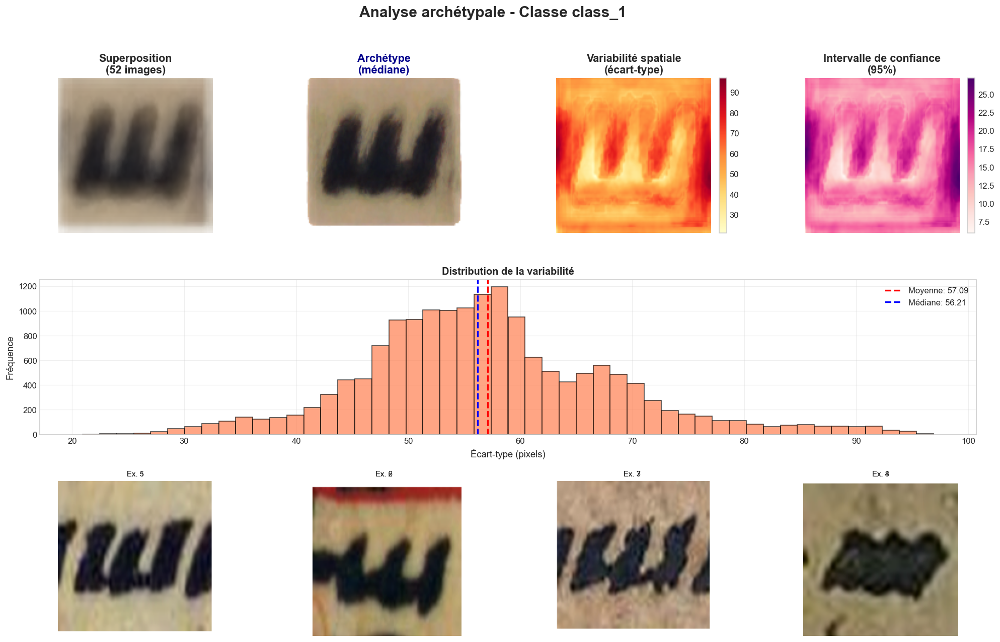


Statistiques pour la classe class_1:
  • Nombre d'images: 52
  • Variabilité moyenne: 57.09 ± 11.29
  • Variabilité médiane: 56.21
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 99.4%

🔍 Détection de 2 sous-archétypes pour la classe class_1


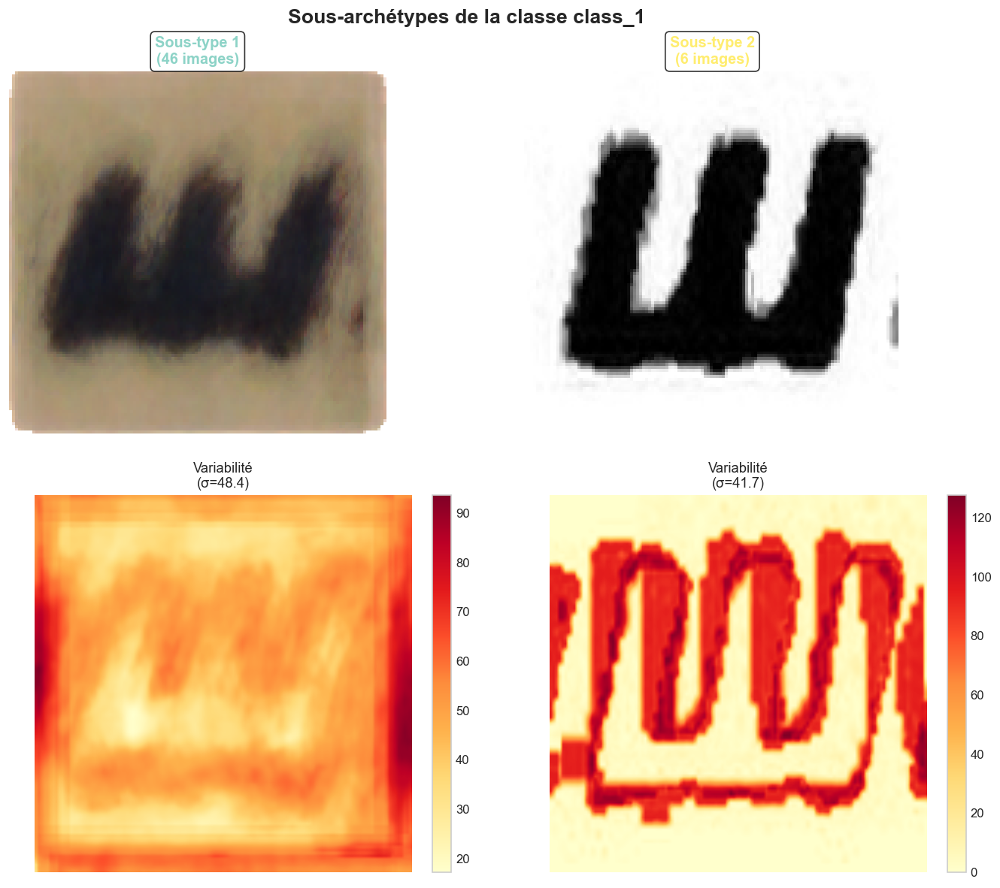


  Distribution des sous-types:
    • Sous-type 1: 46 images (88.5%)
    • Sous-type 2: 6 images (11.5%)


ANALYSE DE LA CLASSE: class_2


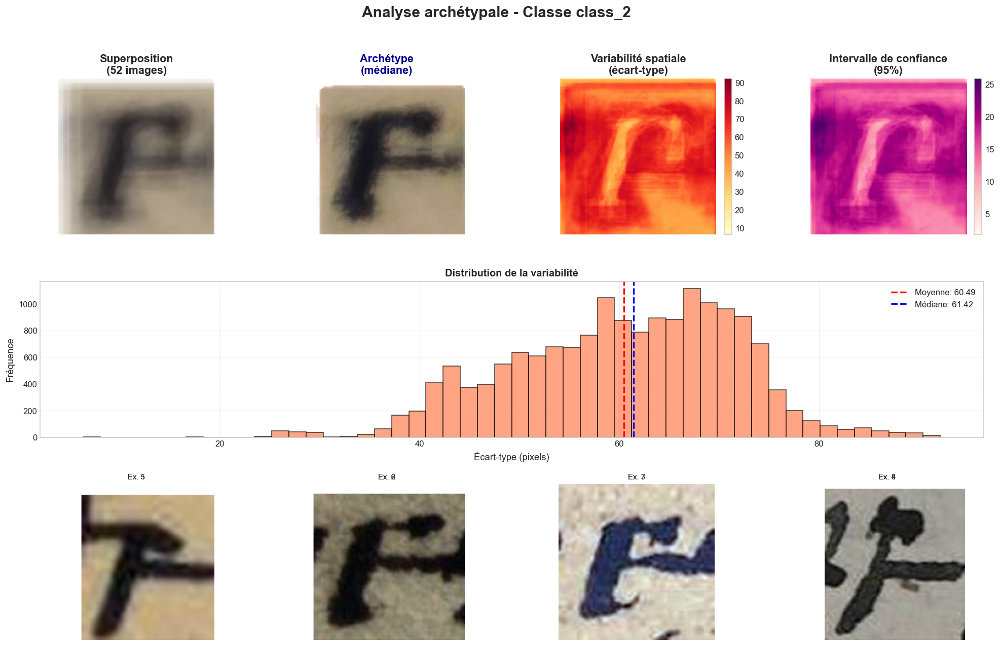


Statistiques pour la classe class_2:
  • Nombre d'images: 52
  • Variabilité moyenne: 60.49 ± 11.06
  • Variabilité médiane: 61.42
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 99.2%

🔍 Détection de 2 sous-archétypes pour la classe class_2


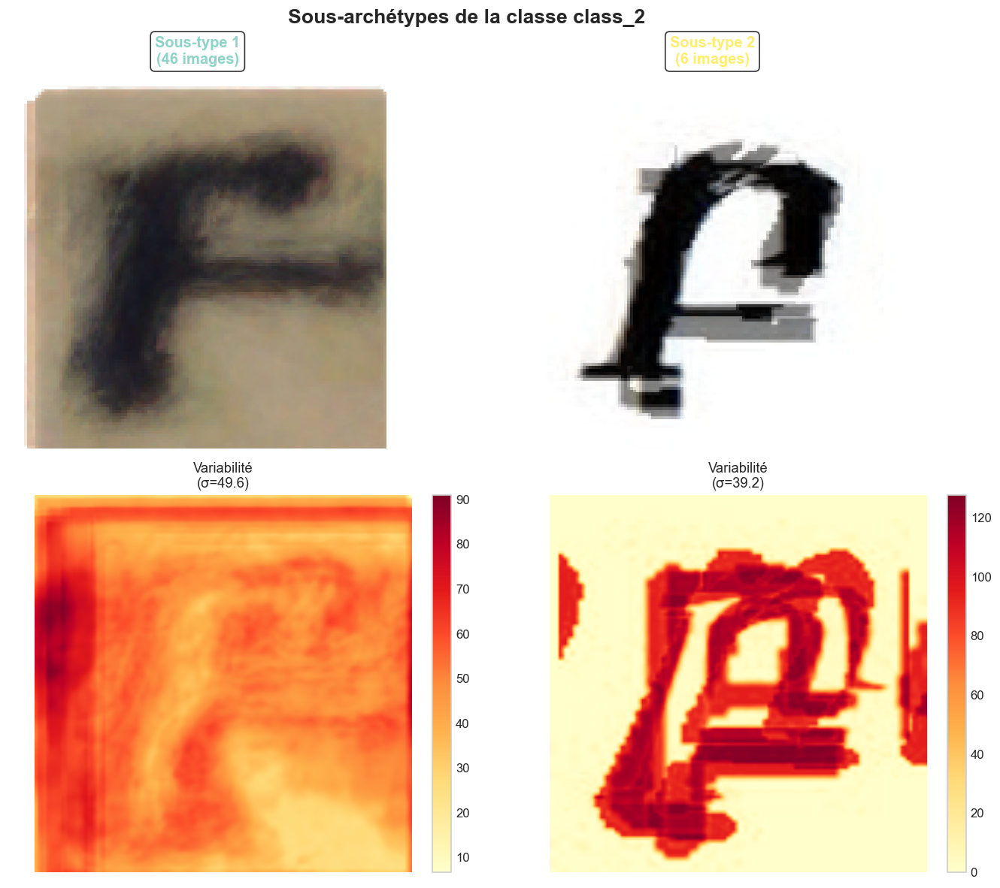


  Distribution des sous-types:
    • Sous-type 1: 46 images (88.5%)
    • Sous-type 2: 6 images (11.5%)


ANALYSE DE LA CLASSE: class_3


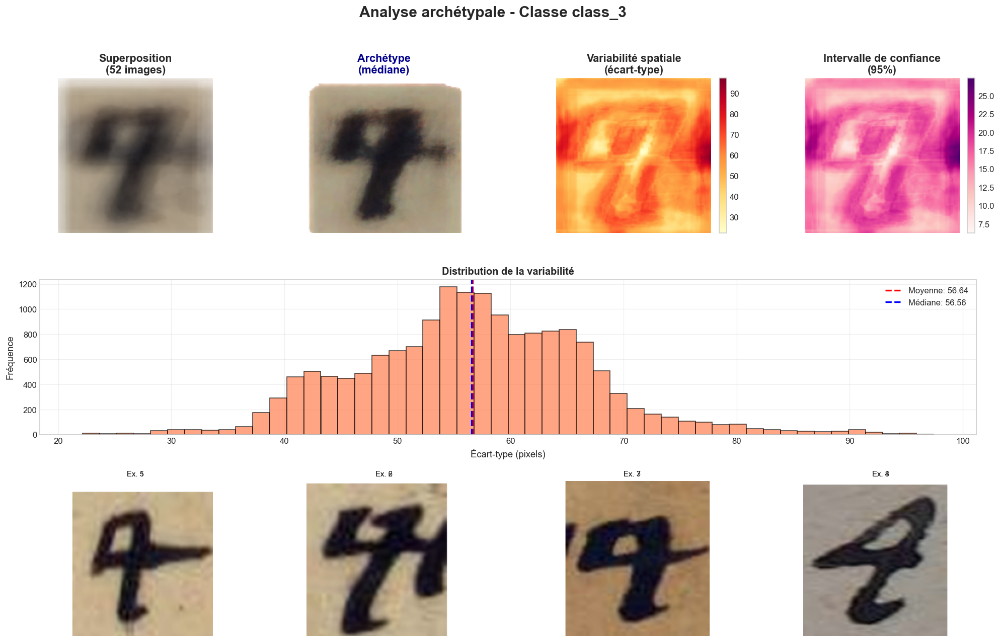


Statistiques pour la classe class_3:
  • Nombre d'images: 52
  • Variabilité moyenne: 56.64 ± 10.13
  • Variabilité médiane: 56.56
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 99.6%

🔍 Détection de 2 sous-archétypes pour la classe class_3


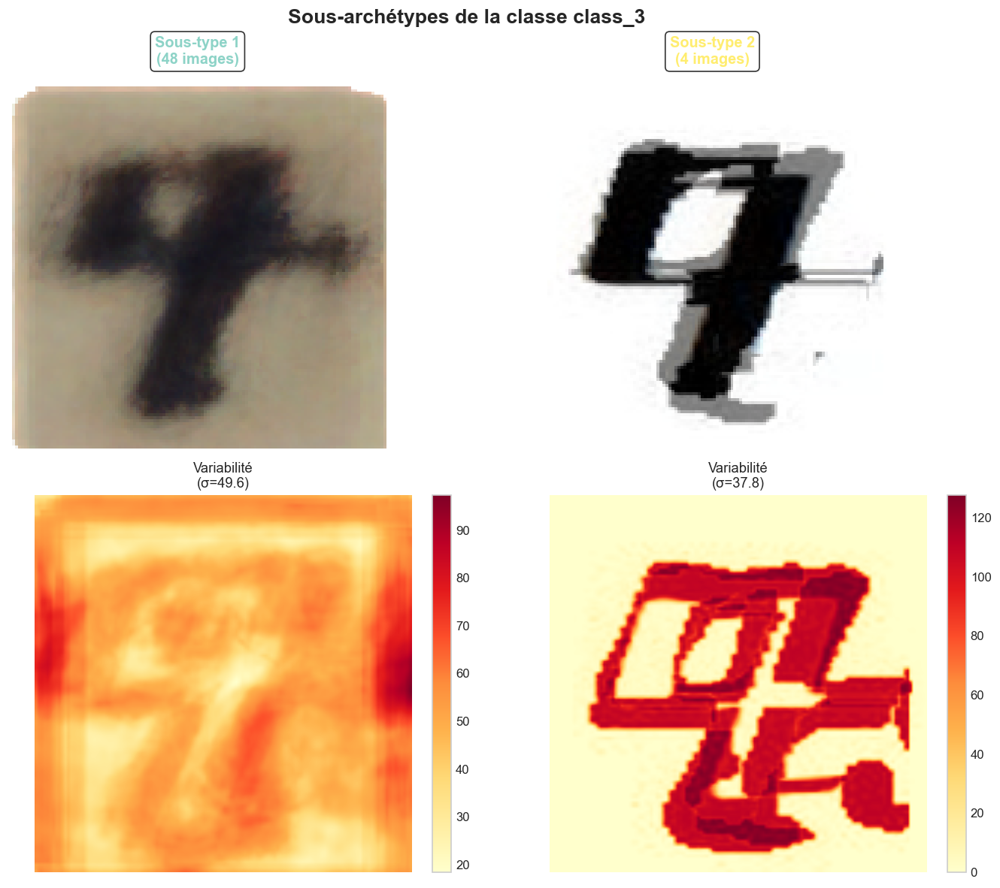


  Distribution des sous-types:
    • Sous-type 1: 48 images (92.3%)
    • Sous-type 2: 4 images (7.7%)


ANALYSE DE LA CLASSE: class_4


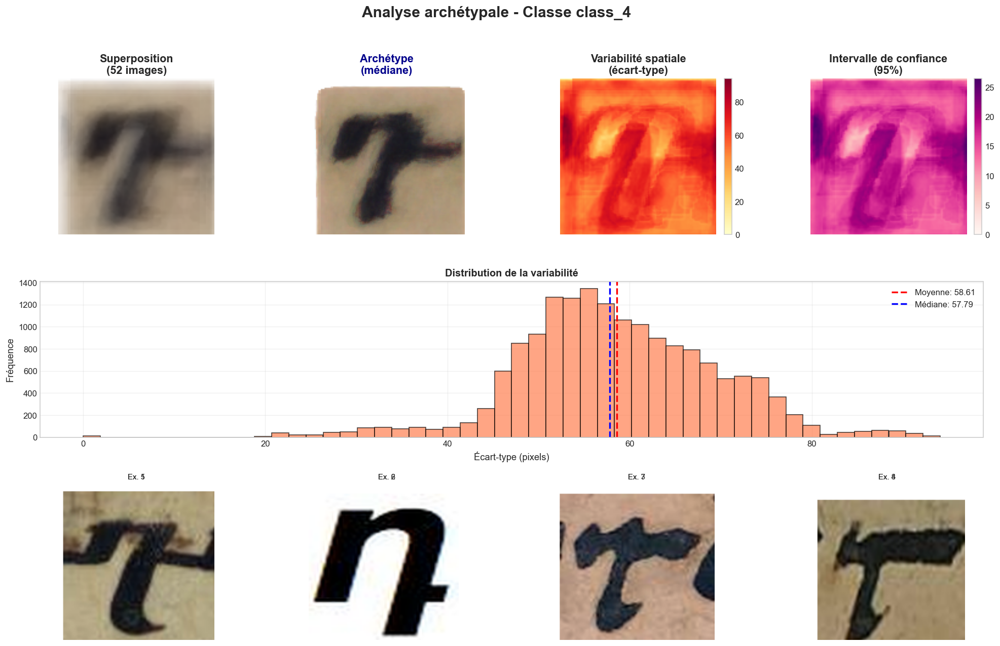


Statistiques pour la classe class_4:
  • Nombre d'images: 52
  • Variabilité moyenne: 58.61 ± 10.83
  • Variabilité médiane: 57.79
  • Zones stables (std < 10): 0.1%
  • Zones variables (std > 30): 98.8%

🔍 Détection de 3 sous-archétypes pour la classe class_4


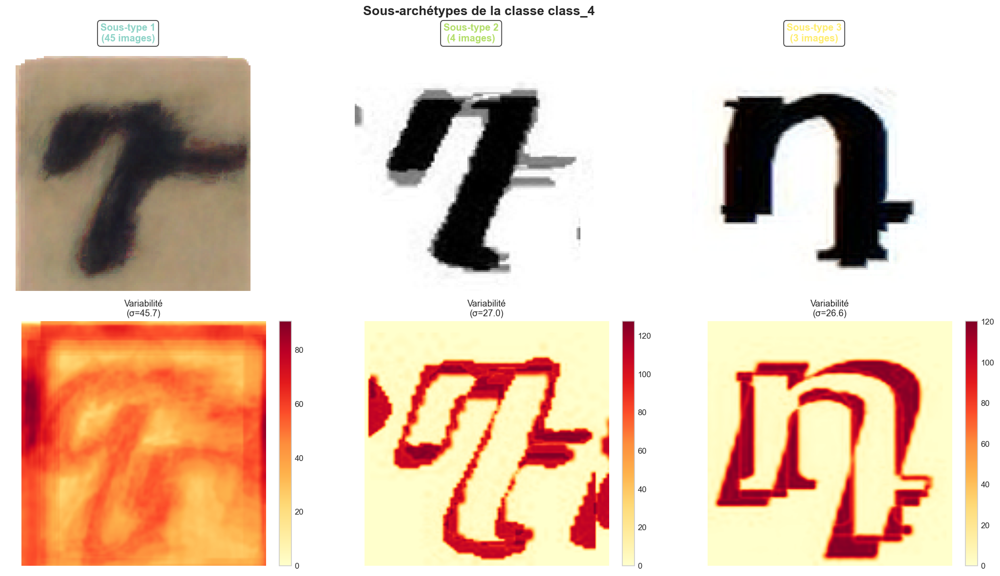


  Distribution des sous-types:
    • Sous-type 1: 45 images (86.5%)
    • Sous-type 2: 4 images (7.7%)
    • Sous-type 3: 3 images (5.8%)


ANALYSE DE LA CLASSE: class_5


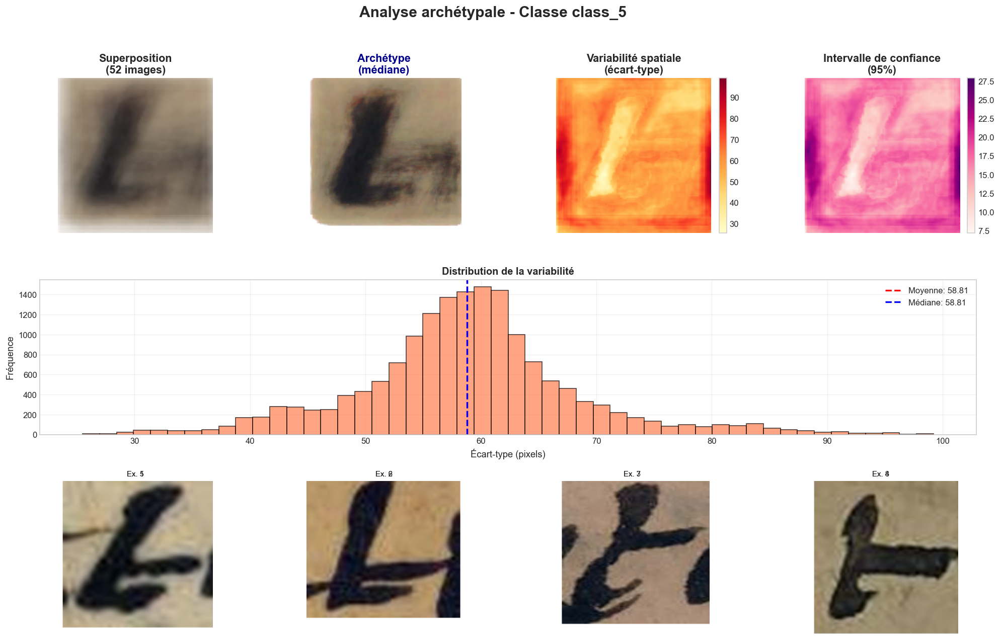


Statistiques pour la classe class_5:
  • Nombre d'images: 52
  • Variabilité moyenne: 58.81 ± 9.55
  • Variabilité médiane: 58.81
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 99.8%

🔍 Détection de 2 sous-archétypes pour la classe class_5


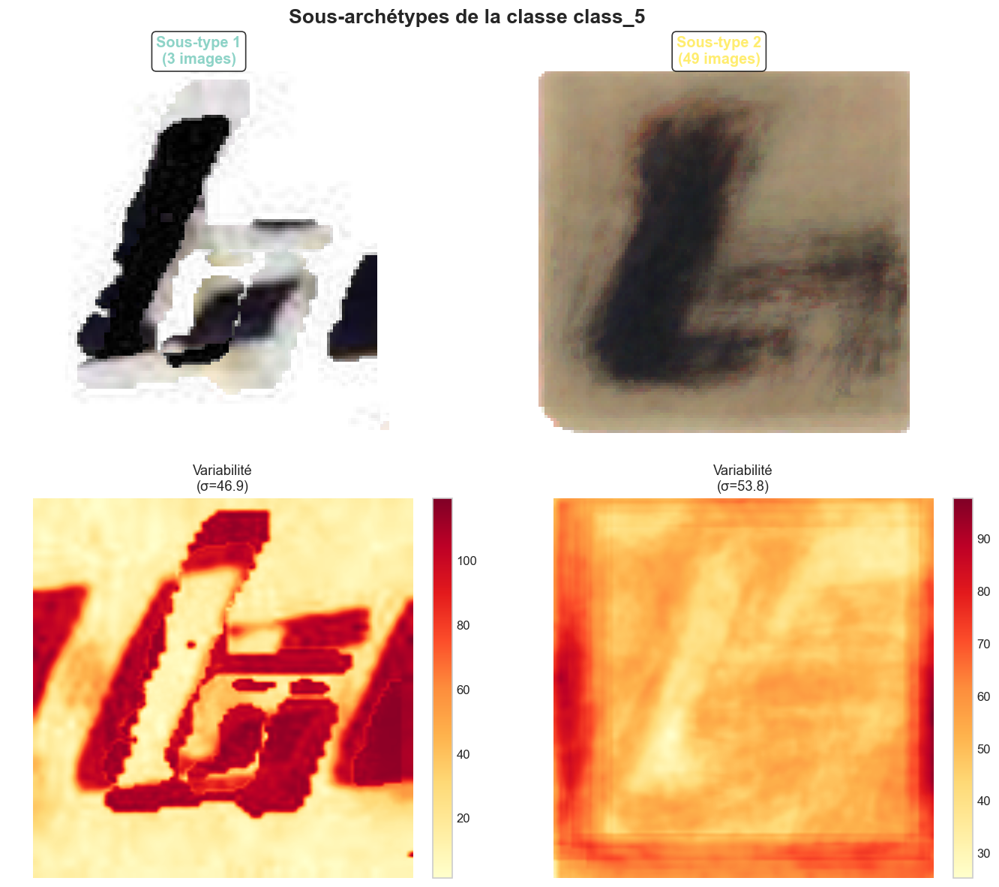


  Distribution des sous-types:
    • Sous-type 1: 3 images (5.8%)
    • Sous-type 2: 49 images (94.2%)


ANALYSE DE LA CLASSE: class_6


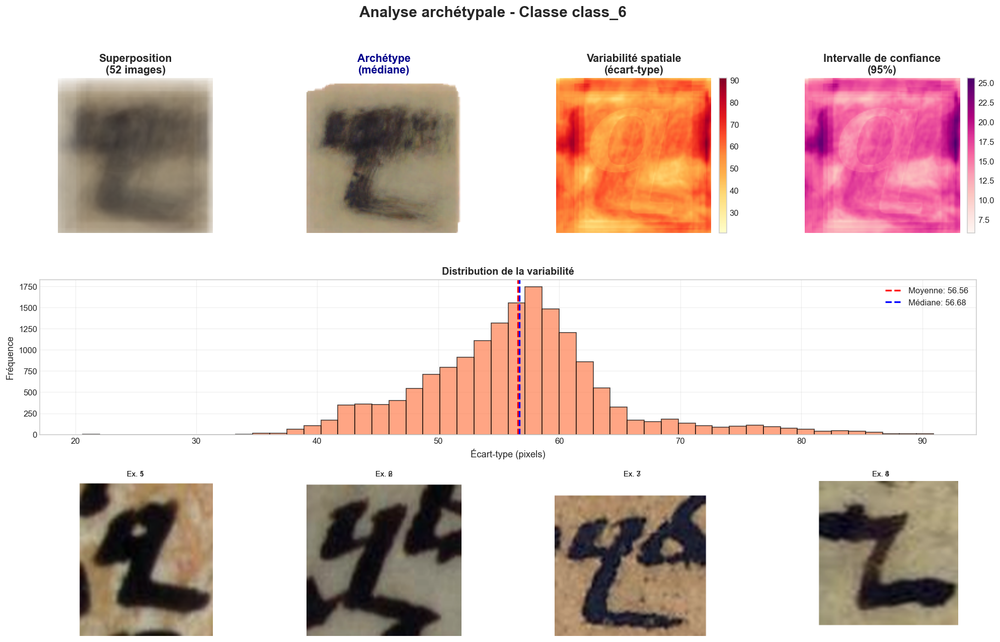


Statistiques pour la classe class_6:
  • Nombre d'images: 52
  • Variabilité moyenne: 56.56 ± 7.94
  • Variabilité médiane: 56.68
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 100.0%
Classe homogène: un seul archétype détecté


ANALYSE DE LA CLASSE: class_7


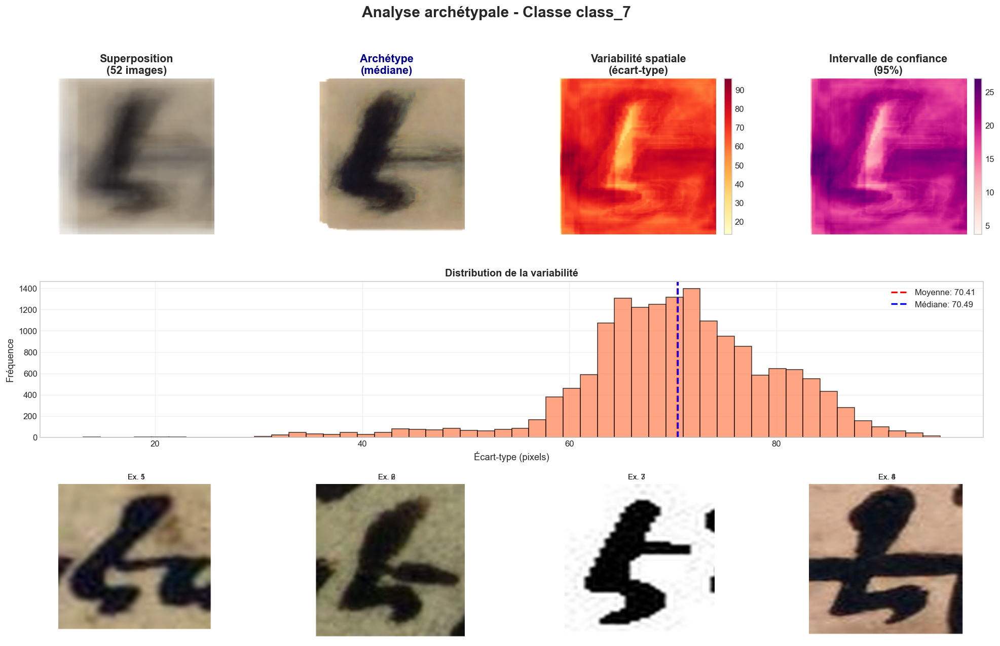


Statistiques pour la classe class_7:
  • Nombre d'images: 52
  • Variabilité moyenne: 70.41 ± 9.54
  • Variabilité médiane: 70.49
  • Zones stables (std < 10): 0.0%
  • Zones variables (std > 30): 100.0%

🔍 Détection de 2 sous-archétypes pour la classe class_7


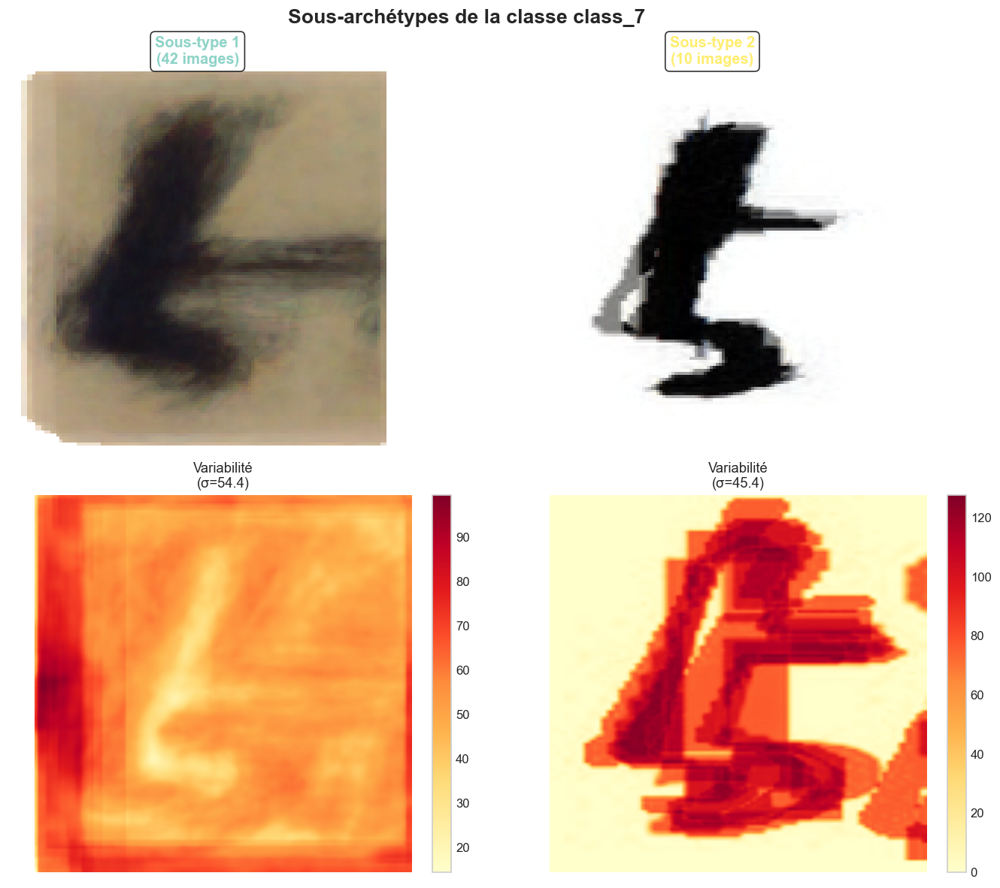


  Distribution des sous-types:
    • Sous-type 1: 42 images (80.8%)
    • Sous-type 2: 10 images (19.2%)



In [23]:
# Analyser toutes les classes
for class_name in class_names:
    analyze_class_archetypes(images, labels, class_name, detect_subtypes=True)

## 8. Comparaison globale des archétypes


COMPARAISON GLOBALE DES ARCHÉTYPES



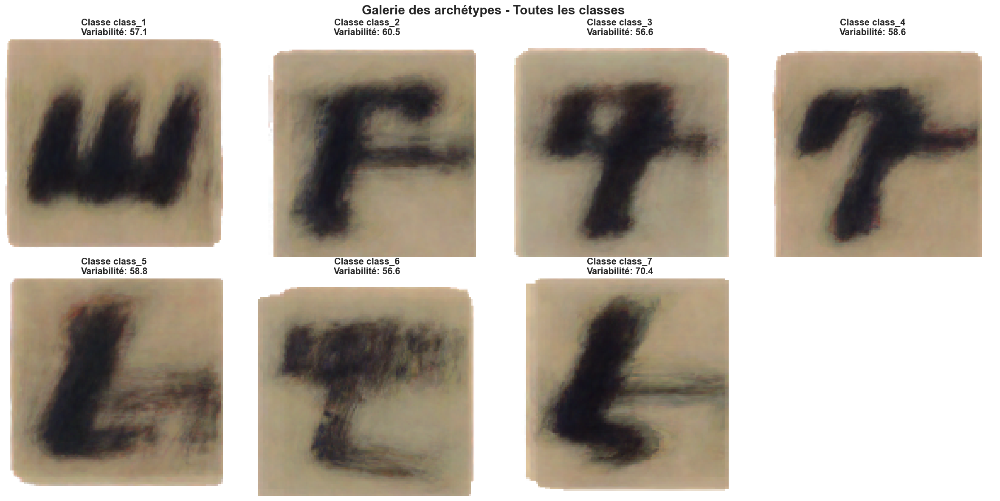


Classement par homogénéité (variabilité croissante):

  1. Classe class_6: σ=56.56 (Variable)
  2. Classe class_3: σ=56.64 (Variable)
  3. Classe class_1: σ=57.09 (Variable)
  4. Classe class_4: σ=58.61 (Variable)
  5. Classe class_5: σ=58.81 (Variable)
  6. Classe class_2: σ=60.49 (Variable)
  7. Classe class_7: σ=70.41 (Variable)

Interprétation:
  Faible variabilité: écriture homogène, archétype fort
  Forte variabilité: diversité d'écriture, archétype flou


In [24]:
print("\n" + "="*80)
print("COMPARAISON GLOBALE DES ARCHÉTYPES")
print("="*80 + "\n")

archetypes_dict = {}
variability_dict = {}

for class_name in class_names:
    class_mask = labels == class_name
    images_class = images[class_mask]
    images_aligned = prepare_images_for_class(images_class)
    archetype, std_map = create_archetype(images_aligned, method='median')
    
    archetypes_dict[class_name] = archetype
    std_gray = np.mean(std_map, axis=2) if len(std_map.shape) == 3 else std_map
    variability_dict[class_name] = std_gray.mean()

# Visualisation en grille
n_classes = len(class_names)
cols = min(4, n_classes)
rows = (n_classes + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
if n_classes == 1:
    axes = [axes]
else:
    axes = axes.flatten()

for i, class_name in enumerate(class_names):
    axes[i].imshow(archetypes_dict[class_name])
    var_val = variability_dict[class_name]
    axes[i].set_title(f'Classe {class_name}\nVariabilité: {var_val:.1f}', 
                      fontsize=13, fontweight='bold')
    axes[i].axis('off')

# Masquer les axes inutilisés
for i in range(n_classes, len(axes)):
    axes[i].axis('off')

fig.suptitle('Galerie des archétypes - Toutes les classes', 
             fontsize=18, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nClassement par homogénéité (variabilité croissante):\n")
sorted_classes = sorted(variability_dict.items(), key=lambda x: x[1])

for rank, (class_name, var_val) in enumerate(sorted_classes, 1):
    stability = "Très stable" if var_val < 15 else "Stable" if var_val < 25 else "Variable"
    print(f"  {rank}. Classe {class_name}: σ={var_val:.2f} ({stability})")

print("\nInterprétation:")
print("  Faible variabilité: écriture homogène, archétype fort")
print("  Forte variabilité: diversité d'écriture, archétype flou")

## 9. Export des archétypes

In [28]:
output_dir = Path("archetypes_output")
output_dir.mkdir(exist_ok=True)

for class_name, archetype in archetypes_dict.items():
    output_path = output_dir / f"archetype_class_{class_name}.png"
    Image.fromarray(archetype).save(output_path)
    print(f"Sauvegardé: {output_path}")

print(f"\nTous les archétypes ont été exportés dans le dossier '{output_dir}'")

Sauvegardé: archetypes_output/archetype_class_class_1.png
Sauvegardé: archetypes_output/archetype_class_class_2.png
Sauvegardé: archetypes_output/archetype_class_class_3.png
Sauvegardé: archetypes_output/archetype_class_class_4.png
Sauvegardé: archetypes_output/archetype_class_class_5.png
Sauvegardé: archetypes_output/archetype_class_class_6.png
Sauvegardé: archetypes_output/archetype_class_class_7.png

Tous les archétypes ont été exportés dans le dossier 'archetypes_output'
